Setup libraries

In [23]:
from pystac_client import Client
from dask.distributed import Client as DaskClient
from odc.stac import load, configure_s3_access
import rasterio as rio
import geopandas as gpd
import pandas as pd
import numpy as np
import xarray as xr
import folium
import utils
from utils import load_data
from utils import mask_and_scale
from sklearn.ensemble import RandomForestClassifier
import odc.geo.xr
import rioxarray

Enter terminal and input `pip install osmnx`

Define catalogue

In [2]:
catalogue = "https://earth-search.aws.element84.com/v1"
client = Client.open(catalogue)

In [3]:
min_lat = -18.155295
min_lon = 177.403231
max_lat = -18.131273065348047 
max_lon = 177.43468904098003
bbox = [min_lon, min_lat, max_lon, max_lat]

In [4]:
datetime="2024-03/2024-10"

In [5]:
dask_client = DaskClient(n_workers=1, threads_per_worker=16, memory_limit='16GB')

configure_s3_access(cloud_defaults=True, requester_pays=True)

/srv/conda/envs/notebook/lib/python3.10/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 41987 instead
  warnings.warn(


In [45]:
# Define training data

gdf = gpd.read_file("marine_tdata_rf.geojson")
gdf = gdf.to_crs("EPSG:4326")
gdf.explore(column="class_id", legend=True)


In [7]:
print(len(gdf))

400


In [34]:
# Search through catalogue for relevant data
items = client.search(
    collections=["sentinel-2-c1-l2a"],
    bbox=bbox,
    datetime=datetime,
    query={"eo:cloud_cover":{"lt": 50}},
).item_collection()

print(f"Found {len(items)} items")


Found 55 items


In [35]:
items

In [36]:
# data = utils.load_data
data = load_data(items, bbox)

In [37]:
scaled = mask_and_scale(data)
scaled

<xarray.Dataset> Size: 145MB
Dimensions:      (time: 31, y: 268, x: 335)
Coordinates:
  * y            (y) float64 2kB 7.995e+06 7.995e+06 ... 7.993e+06 7.993e+06
  * x            (x) float64 3kB 5.426e+05 5.427e+05 ... 5.46e+05 5.46e+05
    spatial_ref  int32 4B 32760
  * time         (time) datetime64[ns] 248B 2024-03-01T22:30:57.691000 ... 20...
Data variables: (12/13)
    red          (time, y, x) float32 11MB dask.array<chunksize=(1, 268, 335), meta=np.ndarray>
    green        (time, y, x) float32 11MB dask.array<chunksize=(1, 268, 335), meta=np.ndarray>
    blue         (time, y, x) float32 11MB dask.array<chunksize=(1, 268, 335), meta=np.ndarray>
    nir08        (time, y, x) float32 11MB dask.array<chunksize=(1, 268, 335), meta=np.ndarray>
    swir16       (time, y, x) float32 11MB dask.array<chunksize=(1, 268, 335), meta=np.ndarray>
    scl          (time, y, x) float32 11MB dask.array<chunksize=(1, 268, 335), meta=np.ndarray>
    ...           ...
    nir09        (time, y, x) float32 11MB dask.array<chunksize=(1, 268, 335), meta=np.ndarray>
    cloud        (time, y, x) float32 11MB dask.array<chunksize=(1, 268, 335), meta=np.ndarray>
    rededge1     (time, y, x) float32 11MB dask.array<chunksize=(1, 268, 335), meta=np.ndarray>
    rededge3     (time, y, x) float32 11MB dask.array<chunksize=(1, 268, 335), meta=np.ndarray>
    rededge2     (time, y, x) float32 11MB dask.array<chunksize=(1, 268, 335), meta=np.ndarray>
    nir          (time, y, x) float32 11MB dask.array<chunksize=(1, 268, 335), meta=np.ndarray>

In [50]:
scaled = scaled.fillna(0)  # Replace NaN with 0 (or use another value based on context)
scaled = scaled.rio.write_crs("EPSG:4326", inplace=True)


In [64]:
print(scaled.isel(time=0).dims)

FrozenMappingWarningOnValuesAccess({'y': 268, 'x': 335})


In [51]:
print(scaled.dims)

FrozenMappingWarningOnValuesAccess({'time': 31, 'y': 268, 'x': 335})


In [66]:
scaled.isel(time=0).isel(time=slice(0, 3)).odc.explore(bands=("red", "green", "blue"), vmin=0, vmax=0.3)


ValueError: Dimensions {'time'} do not exist. Expected one or more of FrozenMappingWarningOnValuesAccess({'y': 268, 'x': 335})

In [67]:
# If your data is 4D (time, lat, lon, bands), slice the time dimension
# scaled.isel(time=0).odc.explore(bands=("red", "green", "blue"), vmin=0, vmax=0.3)


In [68]:
# Create a median composite, which should get rid of most of the remaining clouds
# Note that this will take a few minutes to complete

median = scaled.median("time").compute()
median

<xarray.Dataset> Size: 5MB
Dimensions:      (y: 268, x: 335)
Coordinates:
  * y            (y) float64 2kB 7.995e+06 7.995e+06 ... 7.993e+06 7.993e+06
  * x            (x) float64 3kB 5.426e+05 5.427e+05 ... 5.46e+05 5.46e+05
    spatial_ref  int64 8B 0
Data variables: (12/13)
    red          (y, x) float32 359kB 0.1183 0.1179 0.1171 ... 0.1548 0.153
    green        (y, x) float32 359kB 0.1195 0.1207 0.1208 ... 0.1924 0.1911
    blue         (y, x) float32 359kB 0.1135 0.1132 0.1137 ... 0.1694 0.1726
    nir08        (y, x) float32 359kB 0.1066 0.1066 0.1096 ... 0.113 0.1134
    swir16       (y, x) float32 359kB 0.1079 0.1079 0.1087 ... 0.1098 0.1093
    scl          (y, x) float32 359kB 0.0005 0.0005 0.0005 ... 0.0006 0.0006
    ...           ...
    nir09        (y, x) float32 359kB 0.1184 0.1184 0.1184 ... 0.1068 0.105
    cloud        (y, x) float32 359kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    rededge1     (y, x) float32 359kB 0.1213 0.1213 0.1216 ... 0.1623 0.1634
    rededge3     (y, x) float32 359kB 0.1086 0.1086 0.1082 ... 0.1178 0.1185
    rededge2     (y, x) float32 359kB 0.105 0.105 0.1075 ... 0.1151 0.1154
    nir          (y, x) float32 359kB 0.1057 0.1069 0.108 ... 0.1149 0.1142

In [69]:
median.odc.explore(bands=("red", "green", "blue"), vmin=0, vmax=0.3)


ValueError: Only 2D single-band (x, y) or 3D multi-band (x, y, band) arrays are supported by `.explore()`. Please reduce the dimensions in your array, for example by using `.isel()` or `.sel()`: `da.isel(time=0).odc.explore()`.

In [42]:
# Select a specific band, for example "red"
median_ndvi = median["ndvi"]

# Write the selected band to a COG
median_ndvi.odc.write_cog("median_ndvi.tif", overwrite=True)


KeyError: "No variable named 'ndvi'. Variables on the dataset include ['red', 'green', 'blue', 'nir08', 'swir16', ..., 'rededge2', 'nir', 'y', 'x', 'spatial_ref']"

In [41]:
median_ndvi

<xarray.DataArray 'ndvi' (y: 268, x: 335)> Size: 359kB
array([[ 0.05381423,  0.04726117,  0.04861563, ...,  0.36464712,
         0.3477769 ,  0.34450275],
       [ 0.06784199,  0.0659105 ,  0.08041365, ...,  0.3555157 ,
         0.34615266,  0.40802607],
       [ 0.06571908,  0.06742406,  0.08060329, ...,  0.3504795 ,
         0.3595414 ,  0.44080076],
       ...,
       [ 0.00497513,  0.00447094,  0.00245942, ..., -0.11113023,
        -0.11887422, -0.11596028],
       [ 0.00097845,  0.00230947,  0.00275227, ..., -0.11001112,
        -0.11396061, -0.12337615],
       [ 0.00097845,  0.00247526,  0.00203159, ..., -0.1140834 ,
        -0.12168484, -0.1320509 ]], dtype=float32)
Coordinates:
  * y            (y) float64 2kB 7.995e+06 7.995e+06 ... 7.993e+06 7.993e+06
  * x            (x) float64 3kB 5.426e+05 5.427e+05 ... 5.46e+05 5.46e+05
    spatial_ref  int32 4B 32760

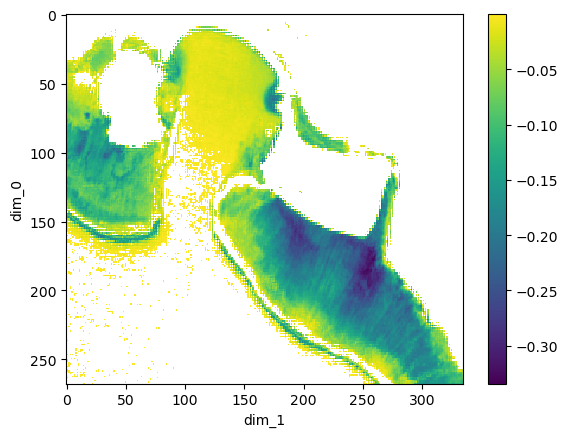

In [42]:
# Open the raster file
with rio.open('median_ndvi.tif') as src:
    band = src.read(1)  # Read the first band (e.g., NDVI)
    
# Define a threshold (e.g., NDVI > 0.2 is considered land)
land_mask = band < 0 # NDVI threshold for land

# Mask the raster to remove water (values below threshold)
masked_raster = np.ma.masked_where(~land_mask, band)

# Assuming masked_raster is a MaskedArray
masked_raster_da = xr.DataArray(masked_raster)

# Plot the DataArray using xarray's built-in plotting
masked_raster_da.plot.imshow(origin="upper")

In [43]:
print(type(median))
print(type(masked_raster_da))


<class 'xarray.core.dataset.Dataset'>
<class 'xarray.core.dataarray.DataArray'>


In [44]:
# Check the variables in the Dataset
print(median.data_vars)

# Select a specific variable (replace 'variable_name' with an actual variable name)
median_variable = median["ndvi"]

# Use the shape of the selected DataArray
coords = {"x": range(median_variable.shape[1]), "y": range(median_variable.shape[0])}

# Convert to xarray.DataArray (if needed)
median_da = xr.DataArray(median_variable.values, dims=("y", "x"), coords=coords)


Data variables:
    red       (y, x) float32 359kB 0.1314 0.1322 0.1313 ... 0.166 0.1642 0.1665
    green     (y, x) float32 359kB 0.1296 0.1293 0.1307 ... 0.2024 0.2015 0.2105
    blue      (y, x) float32 359kB 0.1249 0.1229 0.1244 ... 0.1783 0.1745 0.1812
    nir08     (y, x) float32 359kB 0.1457 0.1457 0.144 ... 0.1149 0.1149 0.1156
    swir16    (y, x) float32 359kB 0.1139 0.1139 0.1163 ... 0.1153 0.1153 0.1125
    scl       (y, x) float32 359kB 0.00065 0.00065 0.00065 ... 0.0006 0.0006
    coastal   (y, x) float32 359kB 0.1226 0.1226 0.1226 ... 0.1651 0.1651 0.1645
    nir09     (y, x) float32 359kB 0.142 0.142 0.142 ... 0.1099 0.1099 0.1094
    cloud     (y, x) float32 359kB 0.0065 0.0065 0.0065 ... 0.0049 0.0049 0.0065
    rededge1  (y, x) float32 359kB 0.1423 0.1423 0.1431 ... 0.1729 0.1729 0.1731
    rededge3  (y, x) float32 359kB 0.1447 0.1447 0.146 ... 0.1189 0.1189 0.1203
    rededge2  (y, x) float32 359kB 0.137 0.137 0.1412 ... 0.1164 0.1164 0.1162
    nir       (y, x) flo

In [45]:
# Assume coordinates (x, y) are available or define them manually
coords = {"x": range(median_da.shape[1]), "y": range(median_da.shape[0])}

# Convert to xarray.DataArray
median_da = xr.DataArray(median_da, dims=("y", "x"), coords=coords)


In [ ]:
masked_analysis = median_da.where(masked_raster_da == 1)  # Mask out areas where mask != 1
masked_analysis.attrs['transform'] = analysis.attrs.get('transform')
masked_analysis.attrs['crs'] = analysis.attrs.get('crs')

In [ ]:
# First transform the training points to the same CRS as the data
training = gdf.to_crs(median.odc.geobox.crs)

# Next get the X and Y values out of the point geometries
training_da = training.assign(x=training.geometry.x, y=training.geometry.y).to_xarray()

# Now we can use the x and y values (lon, lat) to extract values from the median composite
training_values = (
    median.sel(training_da[["x", "y"]], method="nearest").squeeze().compute().to_pandas()
)



In [ ]:
# Write a CRS to the DataArray if known
masked_analysis = masked_analysis.rio.write_crs("EPSG:4326")


In [ ]:
print(masked_analysis.rio.crs)
print(masked_analysis.dims)

In [ ]:
masked_analysis.odc.explore(bands=("red", "green", "blue"), vmin=0, vmax=0.3)

In [ ]:
# Join the training data with the extracted values and remove unnecessary columns
training_array = pd.concat([training["class_id"], training_values], axis=1)
training_array = training_array.drop(
    columns=[
        "y",
        "x",
        "spatial_ref",
    ]
)

# Drop rows where there was no data available
training_array = training_array.dropna()

# Preview our resulting training array
training_array.head()

In [ ]:
# The classes are the first column
classes = np.array(training_array)[:, 0]

# The observation data is everything after the first column
observations = np.array(training_array)[:, 1:]

# Create a model...
classifier = RandomForestClassifier()

# ...and fit it to the data
model = classifier.fit(observations, classes)

In [ ]:
# Convert to a stacked array of observations
stacked_arrays = median.to_array().stack(dims=["y", "x"]).transpose()

# Predict the classes
predicted = model.predict(stacked_arrays)

# Reshape back to the original 2D array
array = predicted.reshape(len(median.y), len(median.x))

# Convert to an xarray again, because it's easier to work with
predicted_da = xr.DataArray(
    array, coords={"y": masked.y, "x": masked.x}, dims=["y", "x"]
)

In [ ]:
print(predicted_da.dtype)  # Check the dtype of your DataArray
predicted_da = predicted_da.astype('float32')  # Convert to float32

In [ ]:
# Put it all on a single interactive map
# center = [np.mean([min_lat[0], max_lat[0]]), np.mean([min_lat[1], max_lat[1]])]
# m = folium.Map(location=center, zoom_start=11)

center = [(min_lat + max_lat) / 2, (min_lon + max_lon) / 2]  # Assuming min_lon and max_lon are defined
m = folium.Map(location=center, zoom_start=13)



# RGB for the median
median.odc.to_rgba(bands=("red", "green", "blue"), vmin=0, vmax=0.3).odc.add_to(m, name="Median Composite")


# Categorical for the predicted classes and for the training data
predicted_da.odc.add_to(m, name="Predicted")
gdf.explore(m=m, column="class_id", legend=True, name="Training Data")

# Layer control
folium.LayerControl().add_to(m)

m

In [ ]:
predicted_da.odc.write_cog("predicted_randomforest_model_1.tif")

In [ ]:
band

In [ ]:
# BONUS ACTIVITY: Following the examples for NDWI and NDVI above, add the index MNDWI


In [ ]:
# BONUS ACTIVITY 2: Rerun the model to see how this might improve your results

